## 33.5) Exercício de PyCaret para Agregação/Clustering

In [1]:
import pycaret
print(pycaret.__version__)

3.3.2


### ambiente do anaconda

In [2]:
import sys
print(sys.executable)

/home/fabiene/anaconda3/envs/pycaret-env/bin/python


importar as bibliotecas 

In [4]:
import numpy as np

from pycaret.clustering import (
    assign_model,
    create_model,
    models,    
    plot_model,
    predict_model,
    save_model,
    setup,
)
from pycaret.datasets import get_data

# PyCaret para Agrupamento

Neste exercício, você vai escolher outra base de dados do Pycaret para repetir a pipeline realizada em aula.

## Base de dados

Recupere todas as bases de dados disponibilizadas pelo Pycaret.

In [6]:
# dados disponvíveis para a análise

In [5]:
all_bases = get_data('index')

,Dataset,Data Types,Default Task,Target Variable 1,Target Variable 2,# Instances,# Attributes,Missing Values
0,anomaly,Multivariate,Anomaly Detection,NaN,NaN,1000,10,N
1,france,Multivariate,Association Rule Mining,InvoiceNo,Description,8557,8,N
2,germany,Multivariate,Association Rule Mining,InvoiceNo,Description,9495,8,N
3,bank,Multivariate,Classification (Binary),deposit,NaN,45211,17,N
4,blood,Multivariate,Classification (Binary),Class,NaN,748,5,N
5,cancer,Multivariate,Classification (Binary),Class,NaN,683,10,N
6,credit,Multivariate,Classification (Binary),default,NaN,24000,24,N
7,diabetes,Multivariate,Classification (Binary),Class variable,NaN,768,9,N
8,electrical_grid,Multivariate,Classification (Binary),stabf,NaN,10000,14,N
9,employee,Multivariate,Classification (Binary),left,NaN,14999,10,N


In [7]:

#     Dataset	    Data Types  	Default Task	Target Variable 1	Target Variable 2	# Instances	# Attributes	Missing Values
# 28	facebook	Multivariate	Clustering	        NaN         	NaN	                   7050  	12	            N

Desta vez, vamos utilizar o dataset `facebook`.

Recupere este dataset.

In [8]:
dataset = get_data('facebook')

,status_id,status_type,status_published,num_reactions,num_comments,num_shares,num_likes,num_loves,num_wows,num_hahas,num_sads,num_angrys
0,246675545449582_1649696485147474,video,4/22/2018 6:00,529,512,262,432,92,3,1,1,0
1,246675545449582_1649426988507757,photo,4/21/2018 22:45,150,0,0,150,0,0,0,0,0
2,246675545449582_1648730588577397,video,4/21/2018 6:17,227,236,57,204,21,1,1,0,0
3,246675545449582_1648576705259452,photo,4/21/2018 2:29,111,0,0,111,0,0,0,0,0
4,246675545449582_1645700502213739,photo,4/18/2018 3:22,213,0,0,204,9,0,0,0,0


In [9]:
dataset.columns

Index(['status_id', 'status_type', 'status_published', 'num_reactions',
       'num_comments', 'num_shares', 'num_likes', 'num_loves', 'num_wows',
       'num_hahas', 'num_sads', 'num_angrys'],
      dtype='object')

'status_id' : estatus

'status_type', estilo de publicação (foto ou vídeo)

'status_published': data e hora 

'num_reactions',
       
'num_comments', 
'num_shares', 
'num_likes',

'num_loves',

'num_wows', Jump into epic online naval battles in World of Warships
      
'num_hahas', 

'num_sads',
'num_angrys'

Verifique quantas instâncias e quantos atributos este dataset possui.

In [10]:
dataset.shape

(7050, 12)

Gere uma base de treinamento correspondente a 90% dos dados totais.

In [11]:
base_train = dataset.sample(frac=0.9, random_state=1)
base_train.shape

(6345, 12)

Gere a base de testes, correspondente aos dados totais que não estão presentes na base de treinamento.

In [12]:
base_test = dataset.drop(base_train.index)
base_test.shape

(705, 12)

## Configuração do ambiente PyCaret

Gere um experimento, utilizando a base de treinamento, baseado no tipo de status e nos atributos que quantificam as reações às publicações. Ou seja, você deve ignorar os atributos `status_id` e `status_published`. Solicite que os dados sejam normalizados.

In [13]:
experiment = setup(data=base_train,
                   normalize = True, 
                   ignore_features = ['status_id', 'status_published'], # ignorar colunas de string e sem importância para a análise
                   session_id=1)

,Description,Value
0,Session id,1
1,Original data shape,"(6345, 12)"
2,Transformed data shape,"(6345, 13)"
3,Ignore features,2
4,Numeric features,9
5,Categorical features,1
6,Preprocess,True
7,Imputation type,simple
8,Numeric imputation,mean
9,Categorical imputation,mode


### Verifique quais são os modelos de agrupamento disponíveis.

In [14]:
models()

,Name,Reference
ID,,
kmeans,K-Means Clustering,sklearn.cluster._kmeans.KMeans
ap,Affinity Propagation,sklearn.cluster._affinity_propagation.Affinity...
meanshift,Mean Shift Clustering,sklearn.cluster._mean_shift.MeanShift
sc,Spectral Clustering,sklearn.cluster._spectral.SpectralClustering
hclust,Agglomerative Clustering,sklearn.cluster._agglomerative.AgglomerativeCl...
dbscan,Density-Based Spatial Clustering,sklearn.cluster._dbscan.DBSCAN
optics,OPTICS Clustering,sklearn.cluster._optics.OPTICS
birch,Birch Clustering,sklearn.cluster._birch.Birch


## Instancie um modelo do tipo Density-Based Spatial Clustering.

In [15]:
dbscan = create_model('dbscan')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.2501,303.5488,1.4035,0,0,0


In [16]:
# --- MÉTRICAS DE CLUSTERIZAÇÃO ---

# Silhouette: Mede quão próximo um ponto está do seu grupo em relação aos outros. 
# Varia de -1 a 1. Quanto mais perto de 1, melhor definido está o grupo.

# Calinski-Harabasz: Razão entre a dispersão entre grupos e dentro dos grupos. 
# Valores mais altos indicam grupos mais densos e bem separados.

# Davies-Bouldin: Avalia a "similaridade" média entre os clusters. 
# Quanto menor o valor (pererto de 0), melhor é a separação entre os grupos.

# Homogeneity (Homogeneidade): Mede se cada cluster contém apenas membros de 
# uma única classe. Varia de 0 a 1 (1 é o ideal).

# Rand Index (RI): Mede a semelhança entre duas atribuições de grupos. 
# É uma medida de concordância entre o modelo e um gabarito real (se houver).

# Completeness (Completude): Mede se todos os membros de uma classe 
# real foram atribuídos ao mesmo cluster. Complementa a Homogeneidade.

1. Silhouette Score

   Mede a distância média interna ($a$) e a distância média para o cluster mais próximo ($b$).$$S = \frac{b - a}{\max(a, b)}$$

2. Davies-Bouldin Index

Calcula a razão entre as distâncias dentro do cluster ($S_i$) e a distância entre os centroides ($R_{ij}$).$$DB = \frac{1}{n} \sum_{i=1}^{n} \max_{j \neq i} \left( \frac{S_i + S_j}{M_{ij}} \right)$$


3. Rand Index

Baseado na contagem de pares de elementos que estão no mesmo grupo ou em grupos diferentes.$$RI = \frac{a + b}{\binom{n}{2}}$$

### Gere os resultados para este modelo.

In [20]:
results_dbscan = assign_model(dbscan)
results_dbscan.tail(20)

,status_type,num_reactions,num_comments,num_shares,num_likes,num_loves,num_wows,num_hahas,num_sads,num_angrys,Cluster
6683,photo,111,68,0,109,2,0,0,0,0,Cluster 1
4343,video,4,0,0,4,0,0,0,0,0,Cluster 0
3561,video,194,645,28,158,35,1,0,0,0,Cluster 0
665,photo,170,3,17,169,1,0,0,0,0,Cluster 1
6959,video,181,2641,131,154,21,4,2,0,0,Cluster -1
6560,photo,22,0,0,22,0,0,0,0,0,Cluster 1
4188,video,1,0,0,1,0,0,0,0,0,Cluster 0
6969,photo,13,0,0,13,0,0,0,0,0,Cluster 1
114,photo,428,14,0,419,4,5,0,0,0,Cluster 1
3989,video,156,333,97,124,30,1,0,0,1,Cluster 14


In [19]:
results_dbscan['Cluster'].unique()

array(['Cluster 0', 'Cluster 1', 'Cluster -1', 'Cluster 2', 'Cluster 3',
       'Cluster 4', 'Cluster 5', 'Cluster 14', 'Cluster 6', 'Cluster 7',
       'Cluster 10', 'Cluster 8', 'Cluster 9', 'Cluster 11', 'Cluster 12',
       'Cluster 16', 'Cluster 17', 'Cluster 13', 'Cluster 15'],
      dtype=object)

os valores Cluster -1 é quando o valor não se encaixa em nenhum estado 

## Gráficos com os resultados do modelo

Exiba um gráfico do modelo com os resultados do agrupamento.

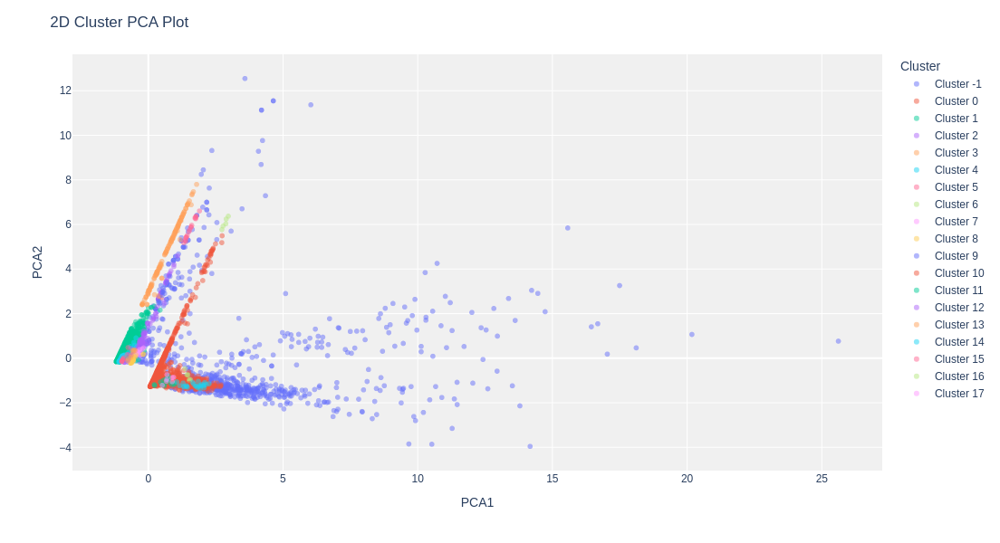

In [21]:
plot_model(dbscan)

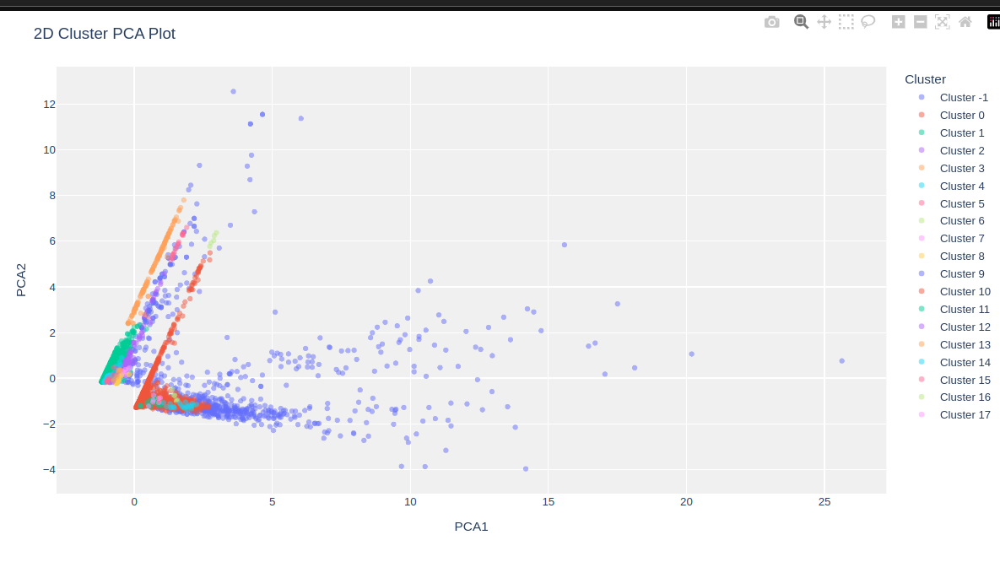

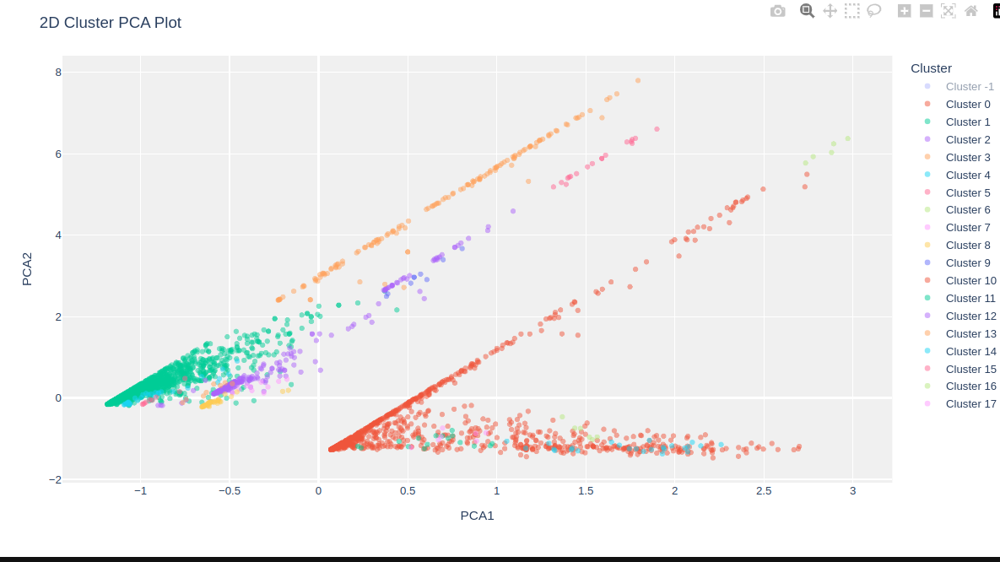

Exiba um gráfico com a distribuição dos clusters gerados.

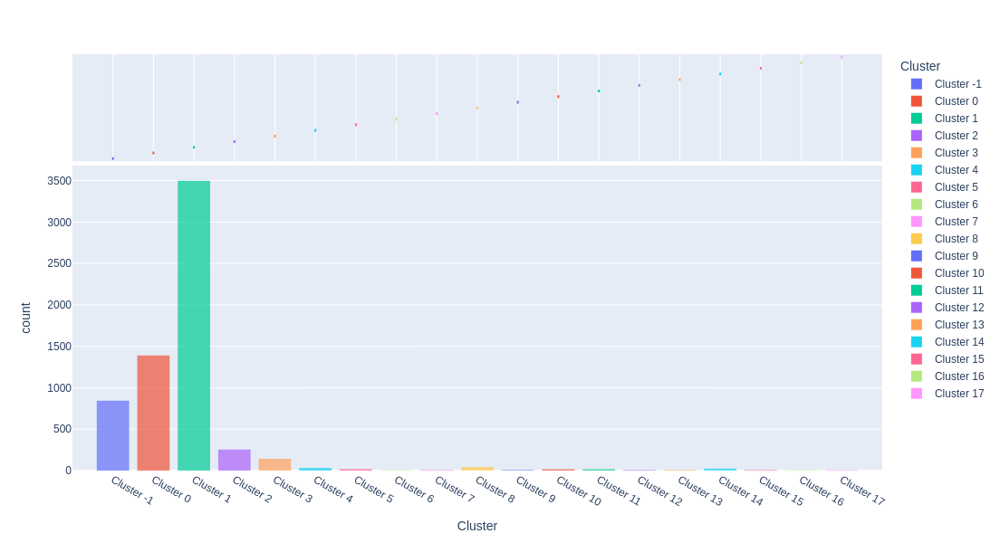

In [22]:
plot_model(dbscan, plot='distribution')

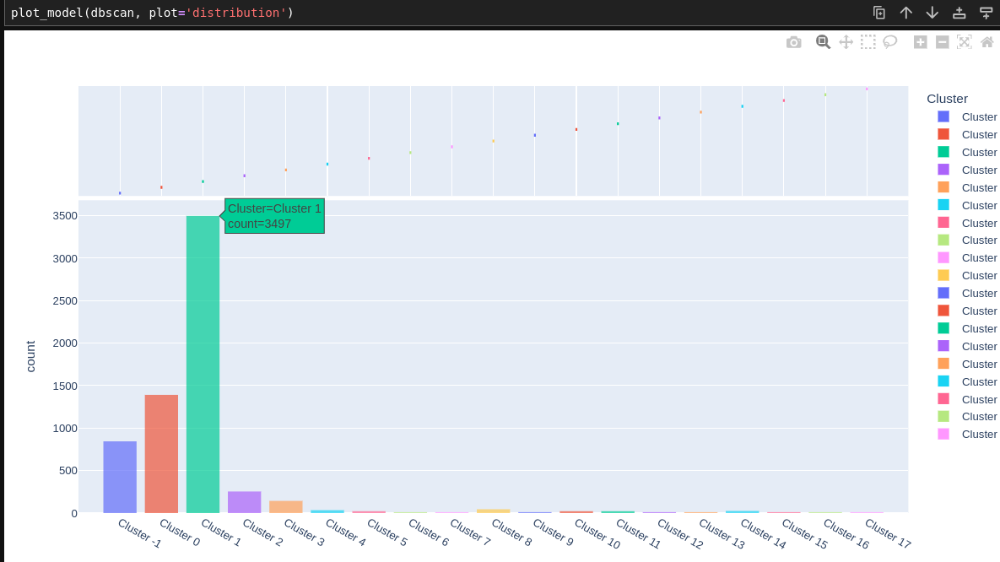

### Exiba o gráfico de distribuição, enfatizando os tipos de status (`statys_type`).

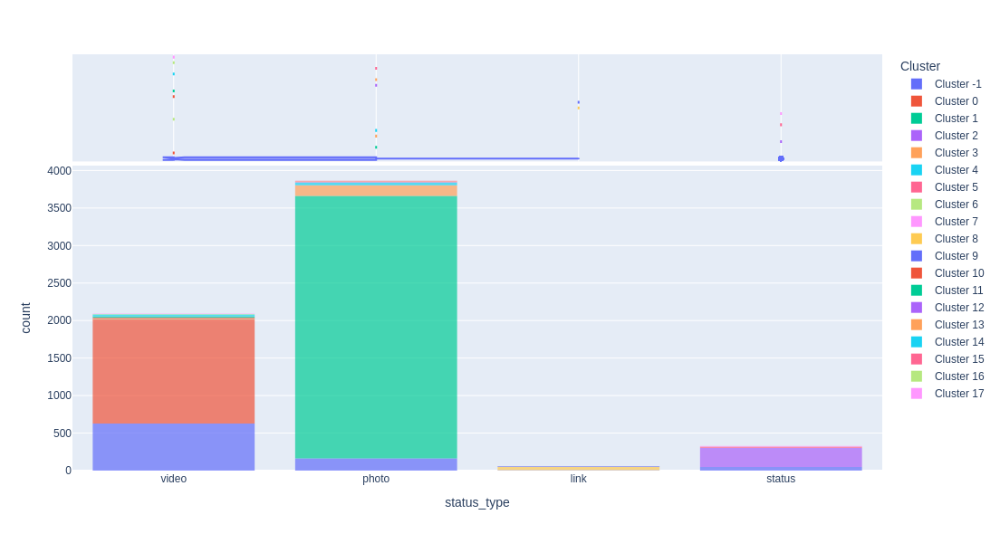

In [23]:
plot_model(dbscan, plot='distribution', feature='status_type')

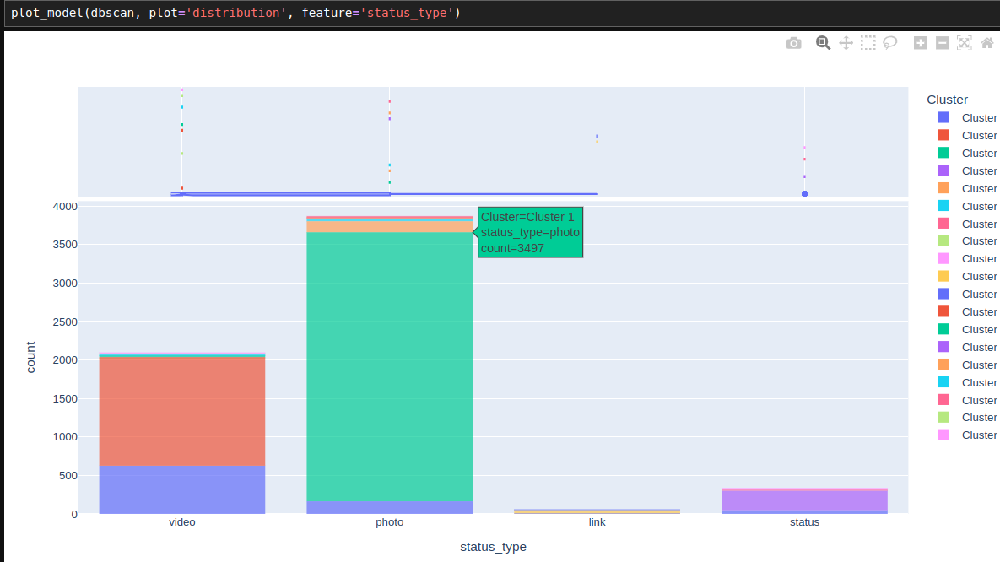

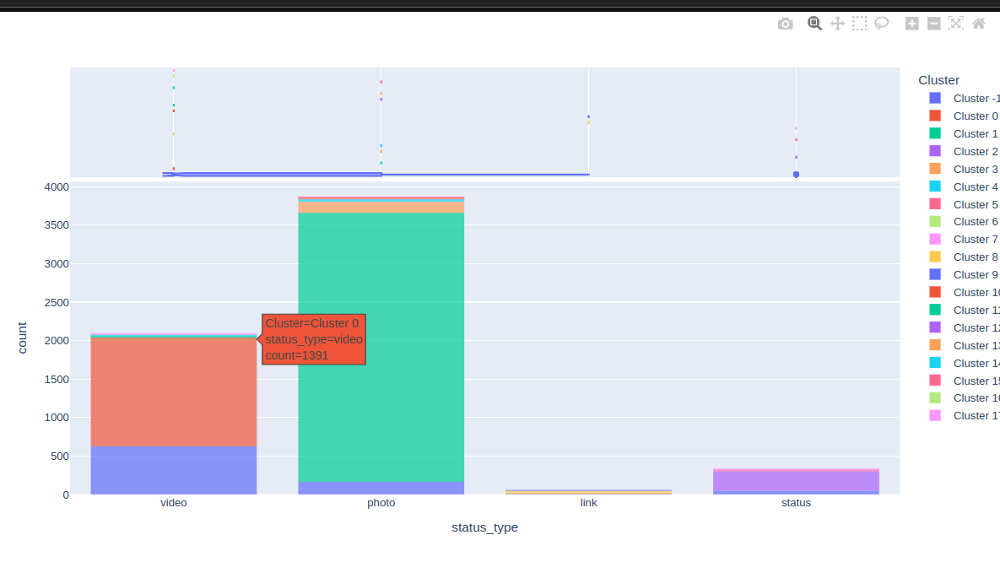

Observe que o Cluster 0 é dominado por publicações de vídeos, o Cluster 1 por publicações de fotos, o Cluster 8 por links e o Cluster 2 por atualizações de status.

Este algoritmo não fornece suporte para predições, somente para agrupamento de todos os dados, sendo utilizado para o estudo do dataset.

### Para finalizar, salve o modelo.

In [25]:
save_model(dbscan, 'dbscan_exercicio_agrupamento')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('numerical_imputer',
                  TransformerWrapper(include=['num_reactions', 'num_comments',
                                              'num_shares', 'num_likes',
                                              'num_loves', 'num_wows',
                                              'num_hahas', 'num_sads',
                                              'num_angrys'],
                                     transformer=SimpleImputer())),
                 ('categorical_imputer',
                  TransformerWrapper(include=['status_type'],
                                     transformer=SimpleImputer(strategy='most_frequent'))),
                 ('onehot_encoding',
                  TransformerWrapper(include=['status_type'],
                                     transformer=OneHotEncoder(cols=['status_type'],
                                                               handle_missing='return_nan',
                           